In [1]:
import os
import glob as glob
import numpy as np
import matplotlib.pyplot as plt
import cv2
import requests
import random

#generate a fiexed data set
SEED =42
np.random.seed(SEED)


# hyperparameters and constants


#### all the training data to pass through the network 25 times


In [2]:
TRAIN = True  # iinvoid the last trained mode be used for inference
EPOCHS = 25


# download and prepare dataset

#### download dataset from internet:https://universe.roboflow.com/?ref=ultralytics

In [3]:
class_names = ['human']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))#colors for bounding boxes
#Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax


In [4]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin
        
        class_name = class_names[int(labels[box_num])]
        
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        ) 

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))
        
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name, 
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image, 
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image, 
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [5]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()
    
    num_images = len(all_training_images)
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

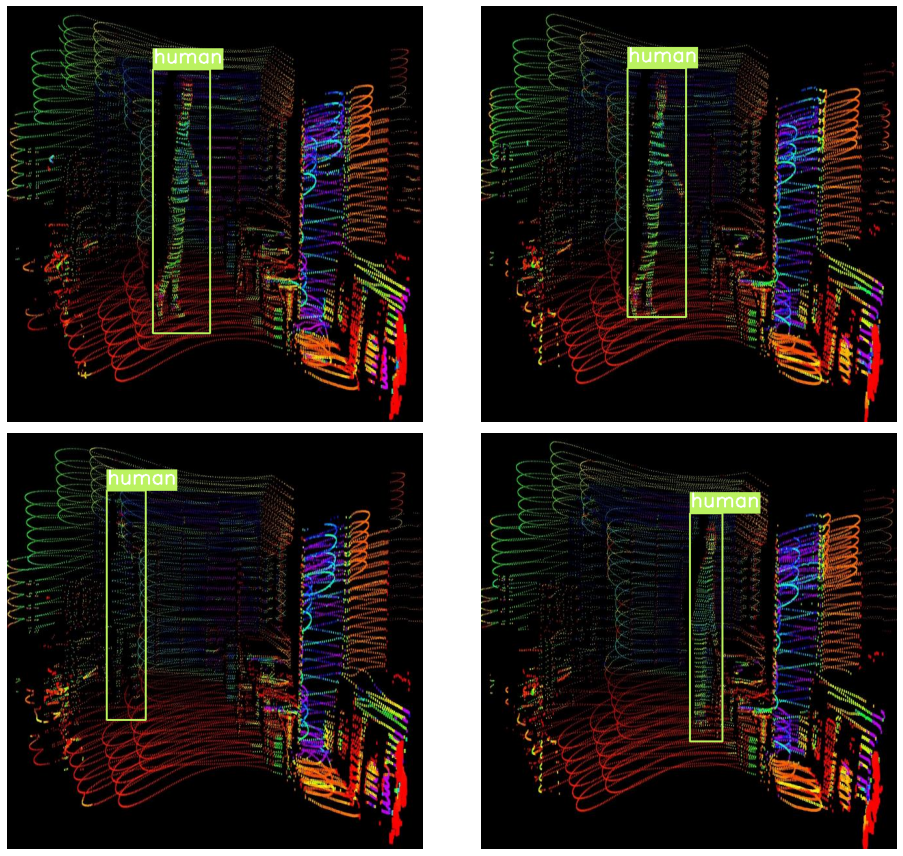

In [6]:
# Visualize a few training images.
plot(
    image_paths='/home/qing/Desktop/SummerProject/train/images/*', 
    label_paths='/home/qing/Desktop/SummerProject/train/labels/*',
    num_samples=4,
)

### help functions for logging

In [18]:
!pwd
import torch
torch.cuda.empty_cache()

/media/qing/KINGSTON/2023-01-28/yolov5


In [36]:
!export LD_LIBRARY_PATH=/usr/local/lib64:$LD_LIBRARY_PATH
!python3 train.py --img 640 --batch 4 --epochs 300 --data /home/qing/Desktop/SummerProject/data.yaml --cfg /media/qing/KINGSTON/2023-01-28/yolov5/models/yolov5m.yaml --weights yolov5m.pt --name yolov5s_results


WARNING ⚠️ Python 3.7.0 is required by YOLOv5, but Python 3.6.9 is currently installed
train: weights=yolov5m.pt, cfg=/media/qing/KINGSTON/2023-01-28/yolov5/models/yolov5m.yaml, data=/home/qing/Desktop/SummerProject/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
WARNING ⚠️ Python 3.7.0 is required by YOLOv5, but Python 3.6.9 is currently installed
YOLOv5 🚀 v7.0-72-g064365d Python-3.6.9 torch-1.10.1+cu102 CUDA:0 (NVIDIA G

In [28]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"./runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(25, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

/media/qing/KINGSTON/2023-01-28/yolov5
confusion_matrix.png			     results.csv
events.out.tfevents.1674946423.qing.17109.0  results.png
F1_curve.png				     train_batch0.jpg
hyp.yaml				     train_batch1.jpg
labels_correlogram.jpg			     train_batch2.jpg
labels.jpg				     val_batch0_labels.jpg
opt.yaml				     val_batch0_pred.jpg
P_curve.png				     val_batch1_labels.jpg
PR_curve.png				     val_batch1_pred.jpg
R_curve.png				     weights
['./runs/train/yolov5s_results19/val_batch0_pred.jpg', './runs/train/yolov5s_results19/val_batch1_pred.jpg']


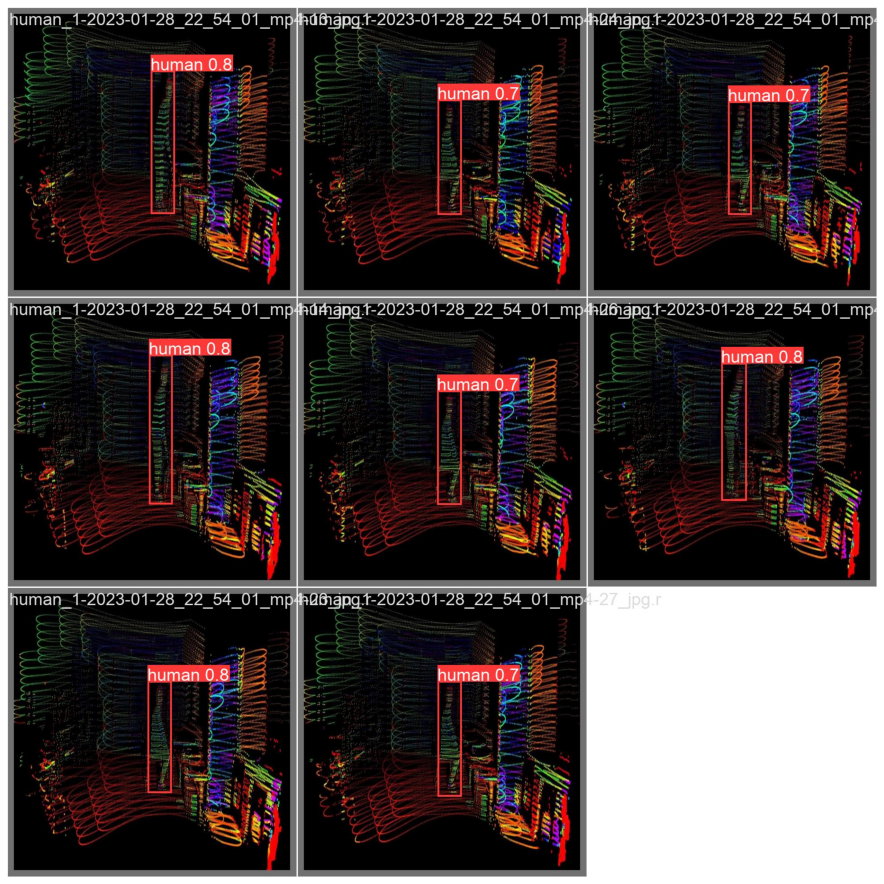

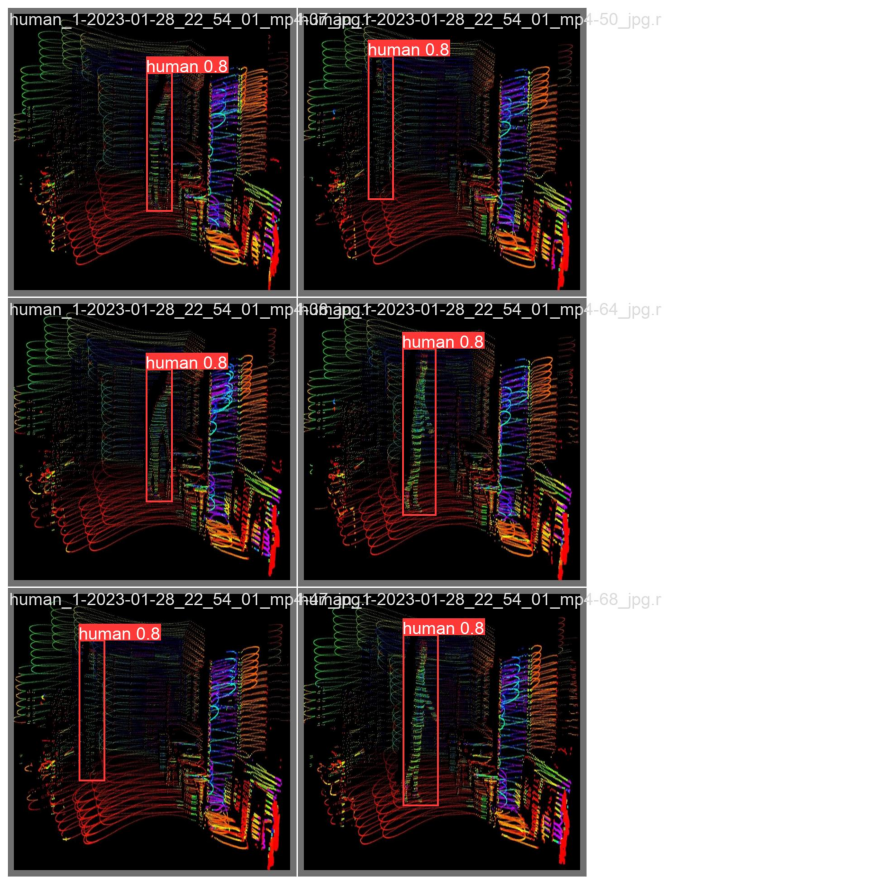

In [37]:
!pwd
show_valid_results("yolov5s_results19")

In [31]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python3 detect.py --weights  {RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    print("return")
    return INFER_DIR

In [38]:
inference( "/media/qing/KINGSTON/2023-01-28/yolov5/runs/train/yolov5s_results19", "/home/qing/Desktop/SummerProject/test/images")

Current number of inference detection directories: 11
inference_12
detect: weights=['/media/qing/KINGSTON/2023-01-28/yolov5/runs/train/yolov5s_results19/weights/best.pt'], source=/home/qing/Desktop/SummerProject/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_12, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
WARNING ⚠️ Python 3.7.0 is required by YOLOv5, but Python 3.6.9 is currently installed
YOLOv5 🚀 v7.0-72-g064365d Python-3.6.9 torch-1.10.1+cu102 CUDA:0 (NVIDIA GeForce RTX 2080 Super with Max-Q Design, 7982MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients
image 1/10 /home/qing/Desktop/SummerProject/test/images/human_1-2023-01-28_22_5

'inference_12'

In [39]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"./runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

['./runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-0_jpg.rf.9c7f74ff8b1c75ddf71064a9de837086.jpg', './runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-17_jpg.rf.acb8282e3d652a5b5e299b4569a7e6d6.jpg', './runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-1_jpg.rf.4034adff7848009fc24d67d9d7a175c6.jpg', './runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-22_jpg.rf.fef341ffff8410f6cba6a8a3597ebf23.jpg', './runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-43_jpg.rf.c4915b1288623f351ad758b4077f6d82.jpg', './runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-53_jpg.rf.42f0e357d430b37fbee99c51a2cba325.jpg', './runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-54_jpg.rf.9dda515c85ca4818b68399988aa1f00b.jpg', './runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-57_jpg.rf.8ed25ae211fbd67d5124803cf43dbb57.jpg', './runs/detect/inference_12/human_1-2023-01-28_22_54_01_mp4-67_jpg.rf.fe0120cdc96a1d9e5e5cf497e88c23f5.jpg', './runs/detect/infer

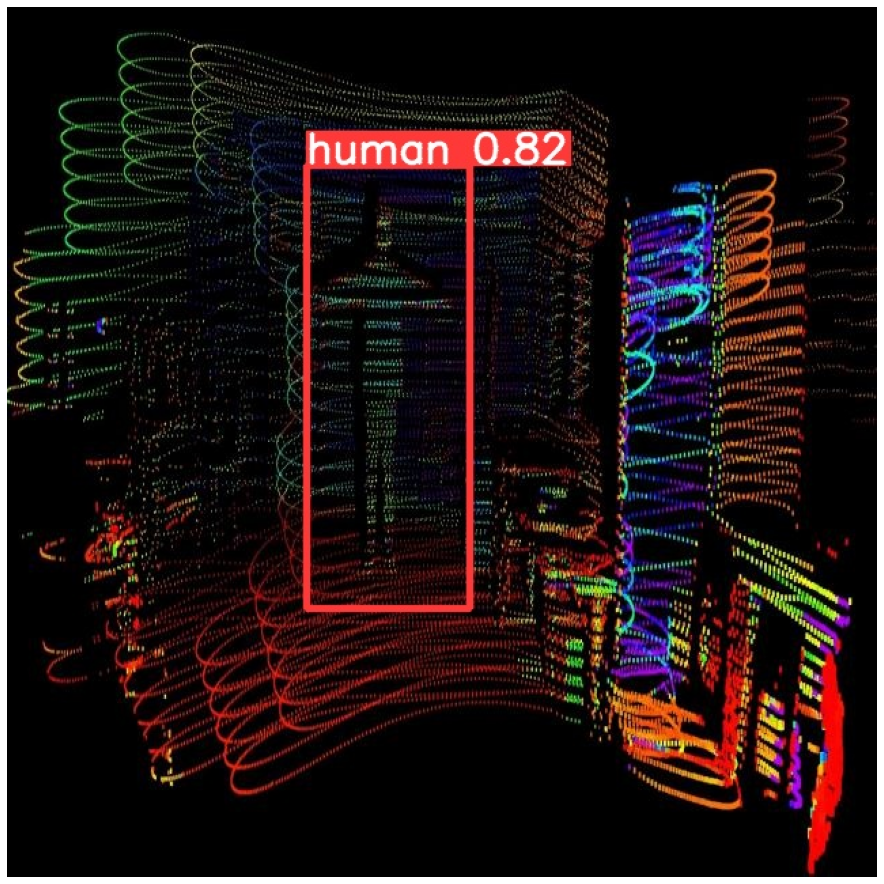

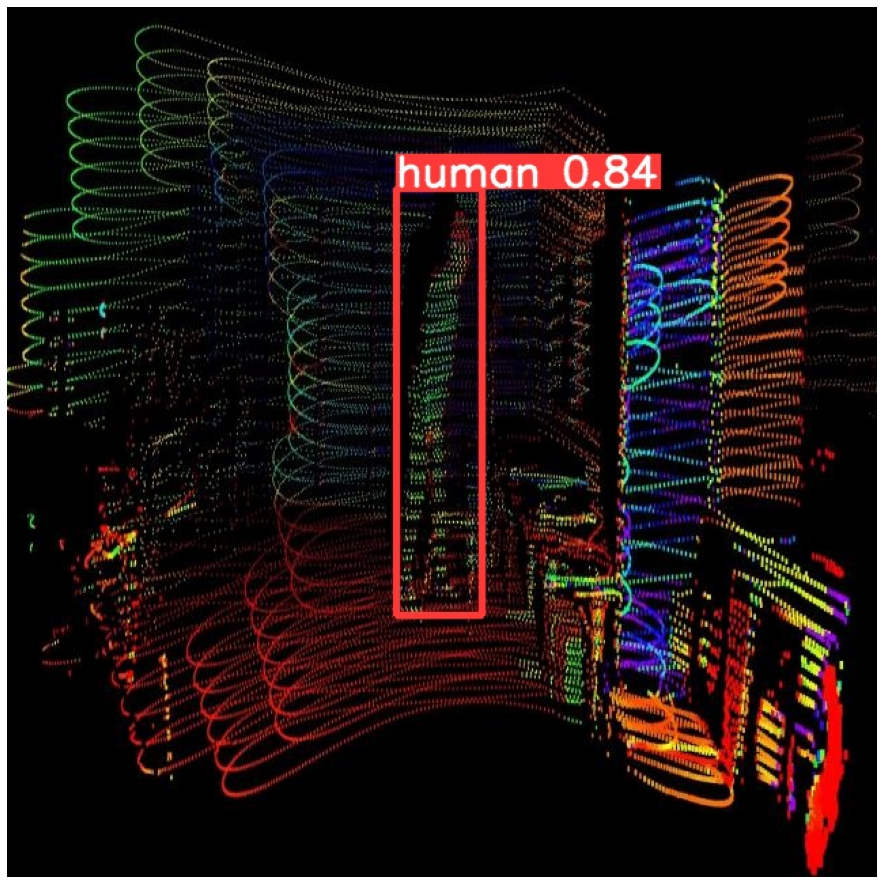

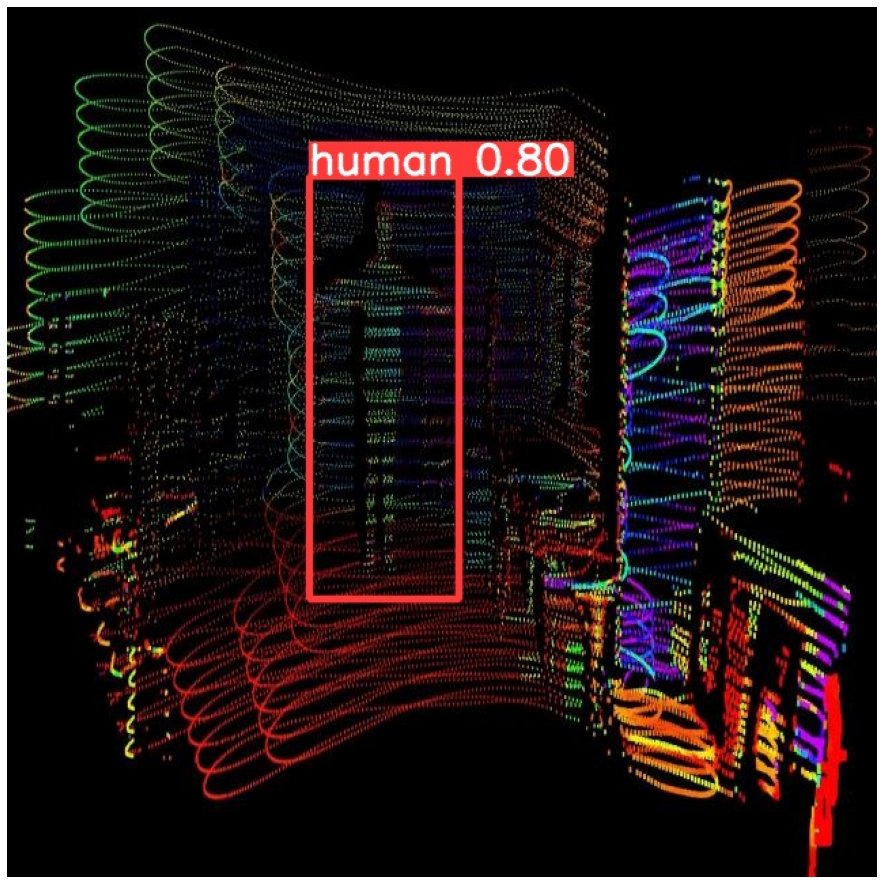

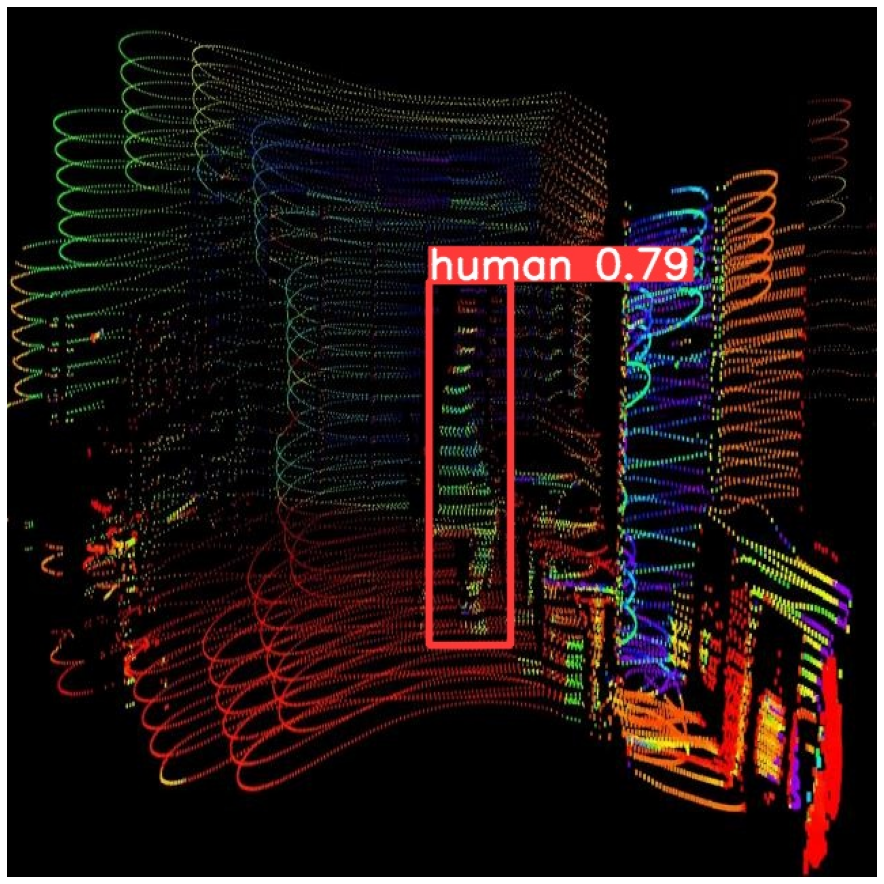

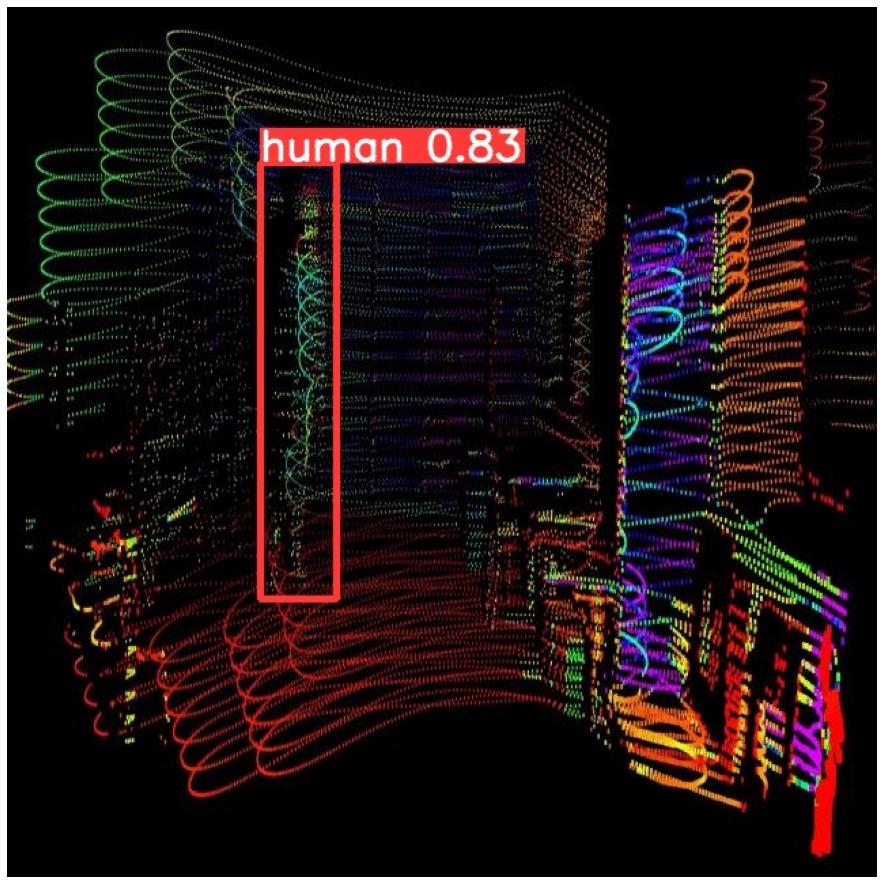

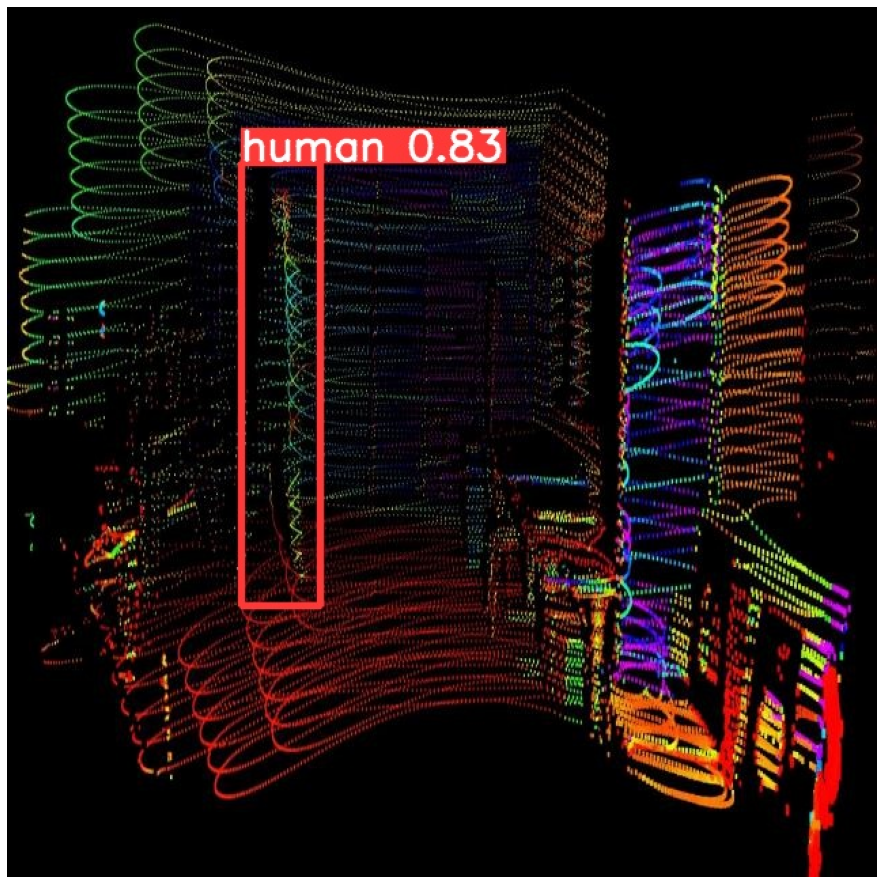

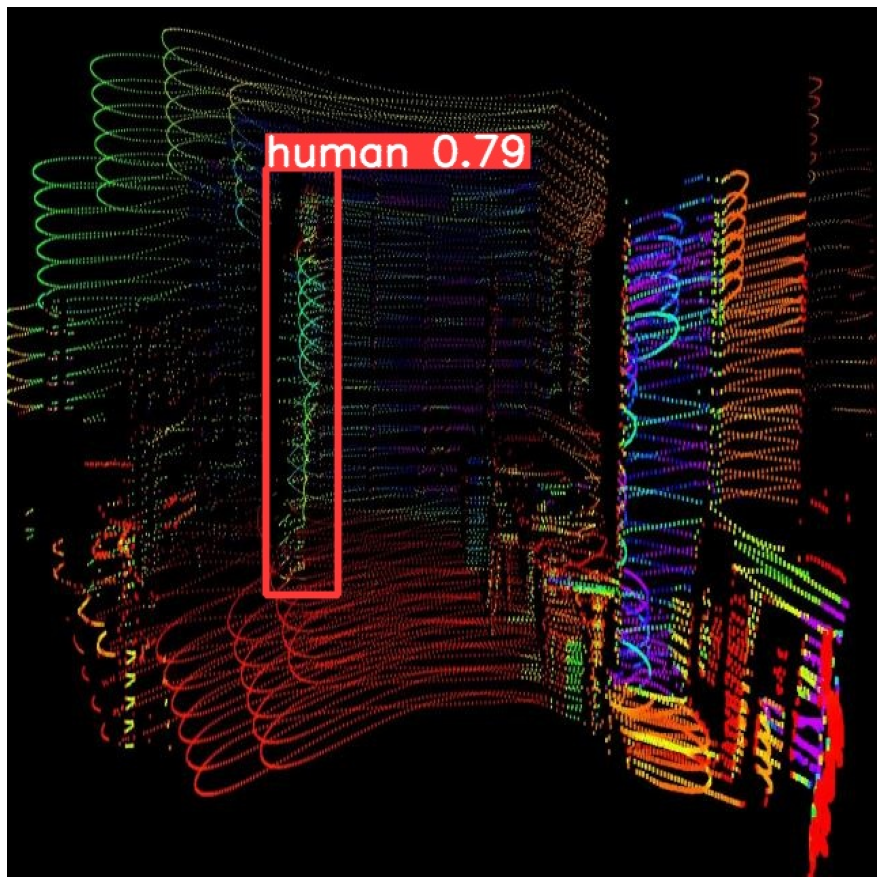

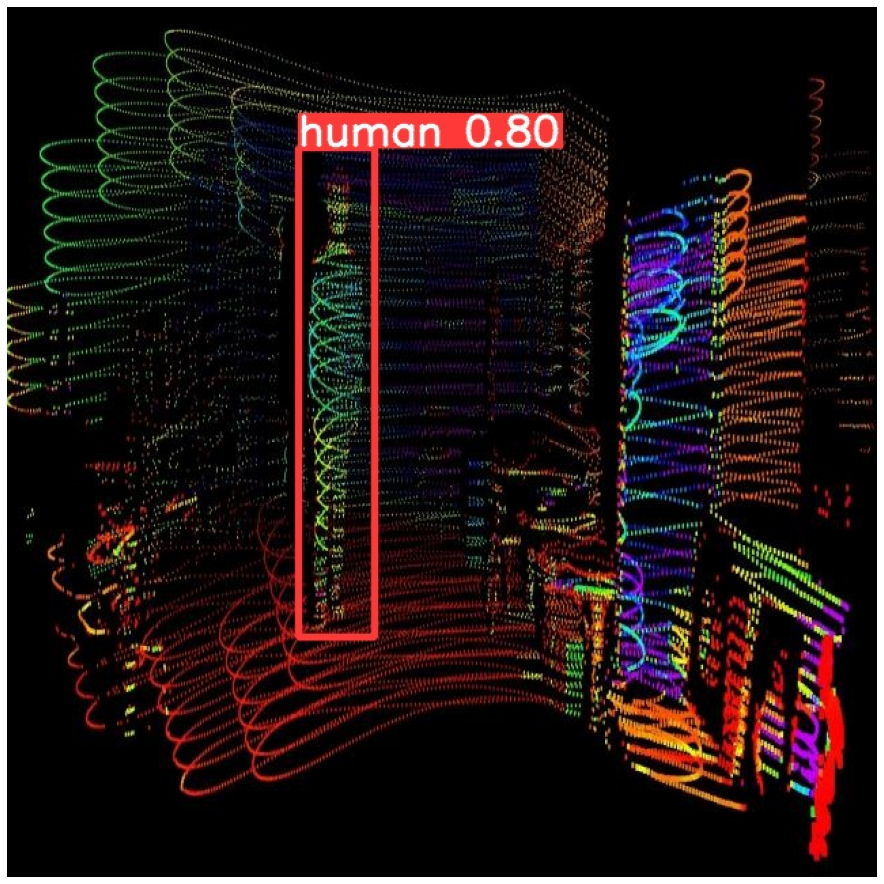

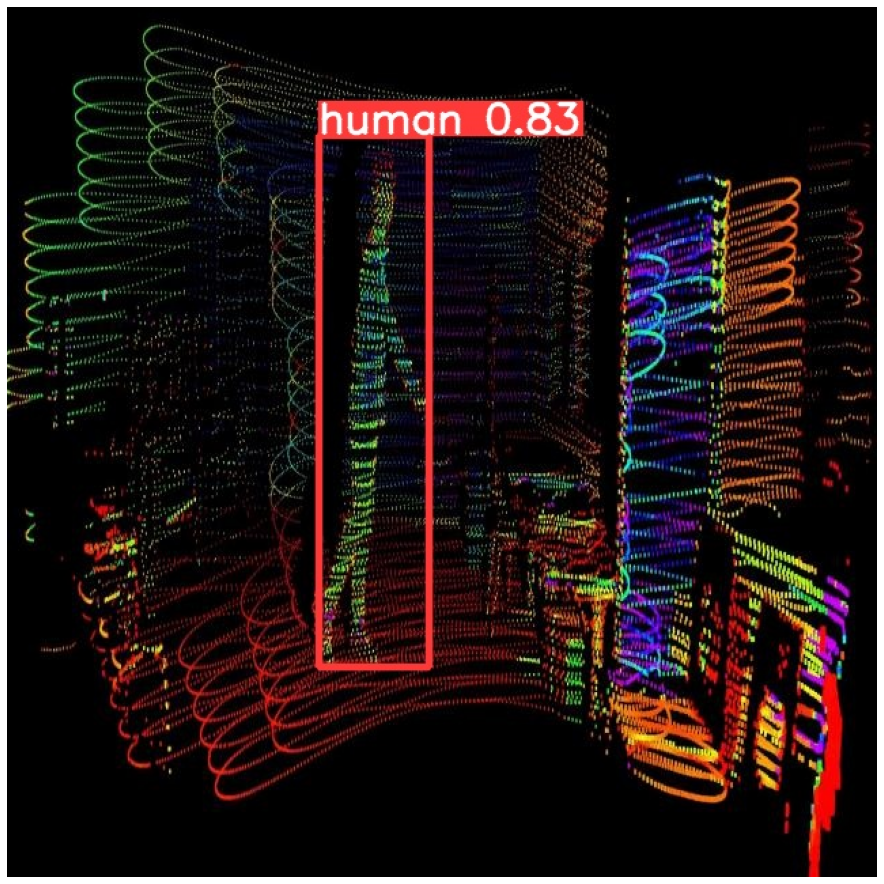

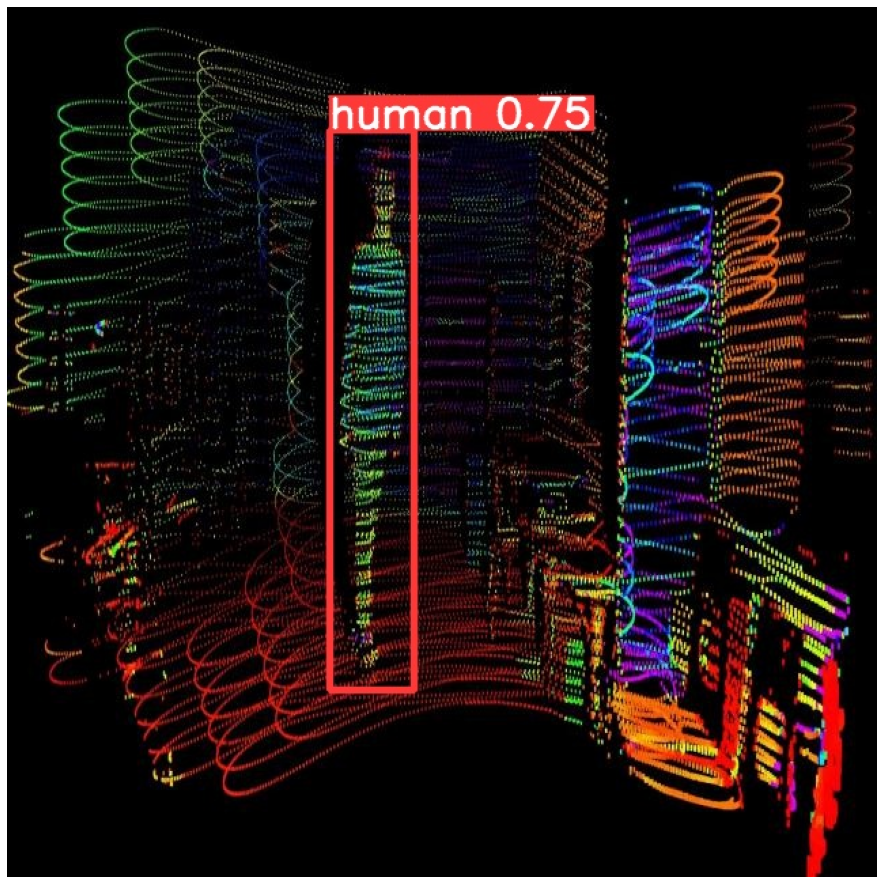

In [41]:
visualize("inference_12")